# Production data: re-exploration

I realize that the issues that I was seeing in production modelling can be traced to a failure to understand the statistics of the production data. Therefore, I am doing a full re-analysis

In [21]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.core.pylabtools import figsize

import numpy as np
import pandas as pd
import polars as pl
import seaborn as sns

import statsmodels.formula.api as smf

In [2]:
__context__ = 'local'

import sys

if __context__ == 'local':
    trainDataLocation = '../data/train/'
    libraryLocation = '../'

elif __context__ == 'kaggle':
    trainDataLocation = '/kaggle/input/predict-energy-behavior-of-prosumers/'
    libraryLocation = '/kaggle/input/'

sys.path.append(libraryLocation)

from enefittools.data import format_dfs

train = pd.read_csv(trainDataLocation+'train.csv')
client = pd.read_csv(trainDataLocation+'client.csv')

train, client = format_dfs(target=train, client=client)

In [3]:
train = train.filter( pl.col('is_consumption')==False)

In [4]:
full_data = train.with_columns(
                    pl.col('prediction_datetime').dt.date().alias('date')
                ).join(client,
                       on=['county', 'product_type', 'is_business', 'date']
                ).with_columns(
                    (pl.col('target') / pl.col('installed_capacity')).alias('target_normalized')
                )

## Graphical exploration

In [5]:
from dash import Dash, html, dcc, callback, Output, Input
import plotly.express as px
import pandas as pd

unit_ids = train['prediction_unit_id'].unique().sort()

app = Dash(__name__)


dates = full_data['prediction_datetime'].dt.date().unique()


app.layout = html.Div([
        html.Label("Unit id:"),
        dcc.Slider(0, len(unit_ids), 1, value=0, marks=None, id='location_slider'),
        dcc.Dropdown(['Normalized', 'Unnormalized'], 'Normalized', id='normalization-dropdown'),
        html.Label("Time Range:"),
        dcc.RangeSlider(0, 23, 1, count=1, value=[0, 23], id='time-slider'),
        dcc.Graph(id='timeseries-graph'),
        html.Label("Date Range:"),
        dcc.RangeSlider(0, dates.shape[0]-1, 1, count=1, value=[0, dates.shape[0]-1], 
                        marks={ i: str(dates[i]) for i in range(0, dates.shape[0]-1, 72)},
                        id='date-slider'),
        dcc.Graph(id='histogram-graph')
])

@callback(
    Output('timeseries-graph', 'figure'),
    Input('location_slider', 'value'),
    Input('normalization-dropdown', 'value'),
    Input('time-slider', 'value')
)
def update_graph(unit_id, normalized, time_interval):
    to_plot = full_data.filter(
                        pl.col('prediction_unit_id') == unit_id,
                        pl.col('prediction_datetime').dt.hour() >= time_interval[0],
                        pl.col('prediction_datetime').dt.hour() <= time_interval[1]
                    ).to_pandas()

    if normalized == 'Normalized':
        y='target_normalized'
    else:
        y='target'
    
    return px.line(to_plot, x='prediction_datetime', y=y, 
                   title=f'{normalized} Production, Unit Id: {unit_id}')


@callback(
    Output('histogram-graph', 'figure'),
    Input('location_slider', 'value'),
    Input('normalization-dropdown', 'value'),
    Input('time-slider', 'value'),
    Input('date-slider', 'value')
)
def update_hist(unit_id, normalized, time_interval, date_interval):
    to_plot = full_data.filter(
                        pl.col('prediction_unit_id') == unit_id,
                        pl.col('prediction_datetime').dt.hour() >= time_interval[0],
                        pl.col('prediction_datetime').dt.hour() <= time_interval[1],
                        pl.col('prediction_datetime').dt.date() >= dates[date_interval[0]],
                        pl.col('prediction_datetime').dt.date() <= dates[date_interval[1]]
                    ).to_pandas()

    if normalized == 'Normalized':
        y='target_normalized'
    else:
        y='target'
    
    return px.histogram(to_plot, x=y, 
                   title=f'{normalized} Production Histogram, Unit Id: {unit_id}')


if __name__ == '__main__':
    app.run(debug=True)

#### Notes on the raw data
1. First, of all, there are obvious similarities among the different prediction units: they all follow similar day-night and seasonal cycles. Reasonable for solar power.

2. Some unique features of prediction units:
   - unit 52, 68: clear examples of more production being added, with massively more production in spring 2023
   - unit 41, 42: show night-time production (eg in summer 2022), with production never reaching 0 for some days
   - unit 4, 17, 48, 55: (among other units) show a 'spiky' production pattern, with days with large production alternating with days of shorter production. This could be due to periodic / auto-correlated weather patterns or usage patterns
  
3. Data histograms:
    - Plotting a histogram over all times, the outputs will be dominated by zeros, due to nights.
    - Plotting histogram over all dates, the outputs are again dominated by zeros, even at noon, due to winters.
    - However, limiting both (eg production at noon on summer months) we can see distributions that are flat, or even peaked at higher fractions of production.
  
    - This represents a challenge for modelling the data: impact of the noise (weather) depends on the context of other seasonal features. Any model that doesn't take this into account will fail to properly model the noise



## Data questions

### Does installed capacity represent an upper bound?

<Axes: title={'center': 'Capacity Normalized Production'}, xlabel='prediction_datetime'>

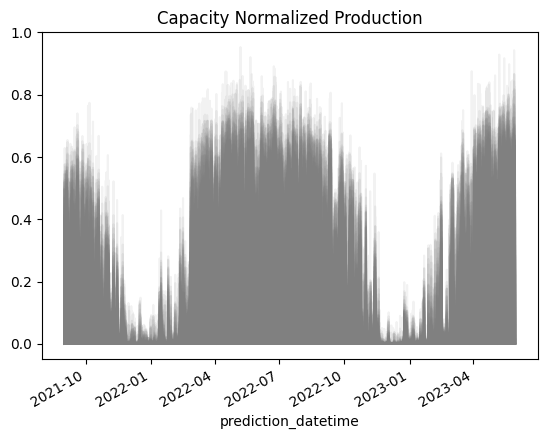

In [6]:
full_data.to_pandas(
        ).pivot(index='prediction_datetime', columns='prediction_unit_id', values='target_normalized'
        ).plot(legend=False, alpha=0.1, color='gray', title='Capacity Normalized Production')


Yes. The installed capacity on any given day is an upper limit on production.

<Axes: title={'center': 'Capacity Normalized By Available Data'}, xlabel='prediction_datetime'>

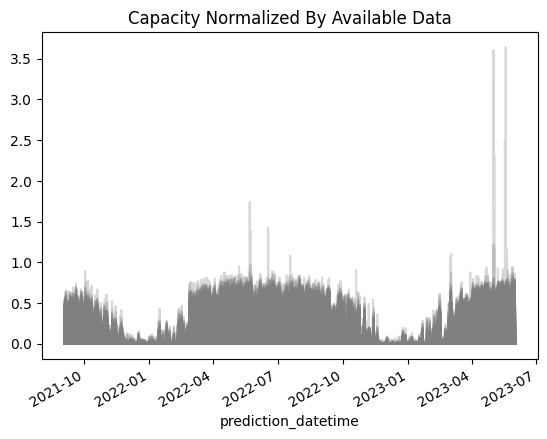

In [7]:
import datetime
train.join(client,
                left_on=['county', 'product_type', 'is_business', 'date_when_predicting'],
                right_on=['county', 'product_type', 'is_business', 'date']
    ).with_columns(
            (pl.col('target') / pl.col('installed_capacity')).alias('target_normalized')
    ).to_pandas(
    ).pivot(index='prediction_datetime', columns='prediction_unit_id', values='target_normalized'
    ).plot(legend=False, alpha=0.3, color='gray', title='Capacity Normalized By Available Data')


When new capacity is installed between the date that we are predicting and the date when the data is measured, this throws off the normalization.

This will be an problem for prediction, but not for training. Correcting it would require predicting when new capacity will be installed.

### These changes in production offer an opportunity

We can test how good the model of production as a fraction of capacity is: centering on changes, the should be no statistical difference between production as a fraction of installed capacity before and after the new installation

In [9]:
capacity_changes = full_data.select( 'date', 'prediction_unit_id', 'installed_capacity'
        ).unique(subset=['prediction_unit_id', 'installed_capacity'], keep='first'
        )

### First, however, we need to know the distribution of production values

It is not sufficient to simply regress out the effect of date and time because, as we saw above, the distribution of outputs depends strongly on the time of day and year. That is, the noise, due to weather, for example, depends strongly on other conditions.

- One option to address this is to run a regression against the parameters of a beta distribution. This would capture the distribution of outputs that we expect, and could be useful for future models.
- Alternatively, we could a regression model anyway, to see if removing the mean could be helpful.

In [57]:
single_unit = full_data.filter( 
                            pl.col('prediction_unit_id') == 0
                      ).with_columns(
                        pl.col('prediction_datetime').dt.time().alias('time'),
                        (pl.col('prediction_datetime').dt.date() - 
                             pd.to_datetime('2021-09-01').date()).dt.total_days().alias('trend')
                     )


In [58]:
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

fourier = CalendarFourier(freq="A", order=6) 
fourier_modes = pl.from_pandas(
                        fourier.in_sample(single_unit['prediction_datetime'].dt.date().unique()
                              ).reset_index()
                  ).with_columns( pl.col('index').dt.date() )

fourier_modes = fourier_modes.rename(
    {col_name: f'{col_name[0:3]}_{col_name[4]}'  for col_name in fourier_modes.columns[-12:]}
)
fourier_columns = ' + '.join(fourier_modes.columns[-12:])

In [59]:
single_unit=single_unit.join(fourier_modes, left_on='date', right_on='index')

### independent daily and yearly effects

In [72]:
model_ind = smf.ols(f'target_normalized ~ C(time) + trend + {fourier_columns}', data=single_unit.to_pandas())
model_ind = model_ind.fit()

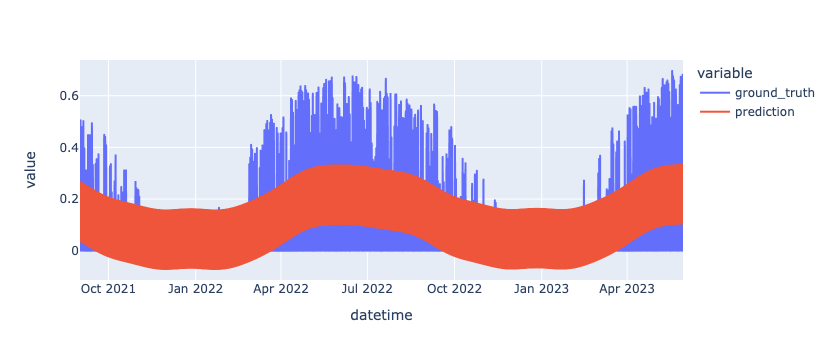

In [73]:
predictions = pl.DataFrame({'datetime': single_unit['prediction_datetime'],
                            'prediction': model_ind.predict(single_unit.to_pandas() ),
                            'ground_truth': single_unit['target_normalized']}
                          ).with_columns(
                                (pl.col('ground_truth') - pl.col('prediction')).alias('error')
                          )


px.line( predictions, x='datetime', y=['ground_truth', 'prediction'])

Yeah, it sucks.

### dependent daily and yearly effects

In [74]:
model_dep = smf.ols(f'target_normalized ~ C(time) * ( trend + {fourier_columns})', data=single_unit.to_pandas())
model_dep = model_dep.fit()

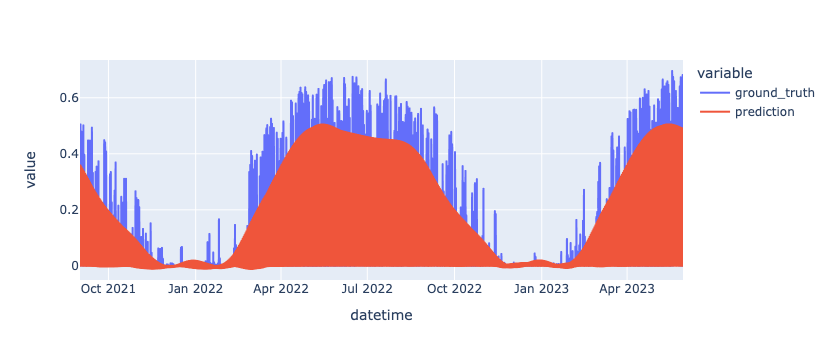

In [75]:
predictions = pl.DataFrame({'datetime': single_unit['prediction_datetime'],
                            'prediction': model_dep.predict(single_unit.to_pandas() ),
                            'ground_truth': single_unit['target_normalized']}
                          ).with_columns(
                                (pl.col('ground_truth') - pl.col('prediction')).alias('error')
                          )


px.line( predictions, x='datetime', y=['ground_truth', 'prediction'])

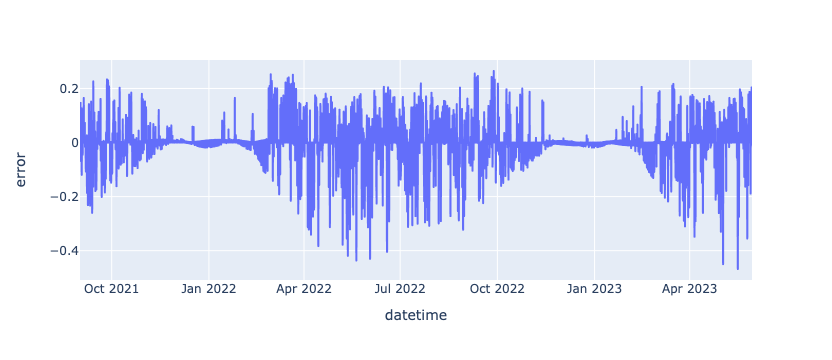

In [78]:
px.line(predictions, x='datetime', y='error')

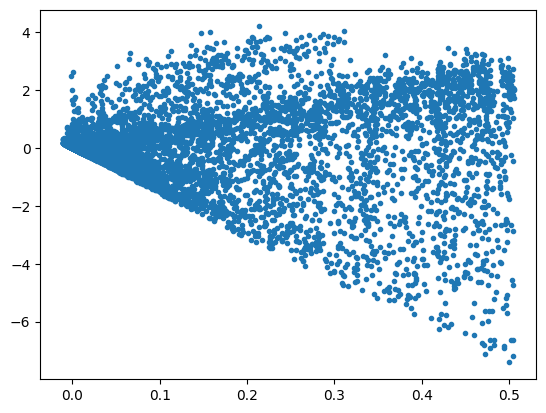

In [77]:
plt.plot( model_dep.fittedvalues, model_dep.resid_pearson, '.')

Ok, honestly, the fits don't look bad. 
- The residual plot show heteroskedasticity, as we expect from the visual analysis
- The error shows time (magnitude) dependency. At least they look somewhat gaussian.

### linear model of fold changes

In [102]:
single_unit = single_unit.with_columns(
                                np.log1p( pl.col('target_normalized') ).alias('log_target')
                            )
model_dep_fold = smf.ols(f'log_target ~ C(time) * ( trend + {fourier_columns})', data=single_unit.to_pandas())
model_dep_fold = model_dep_fold.fit()

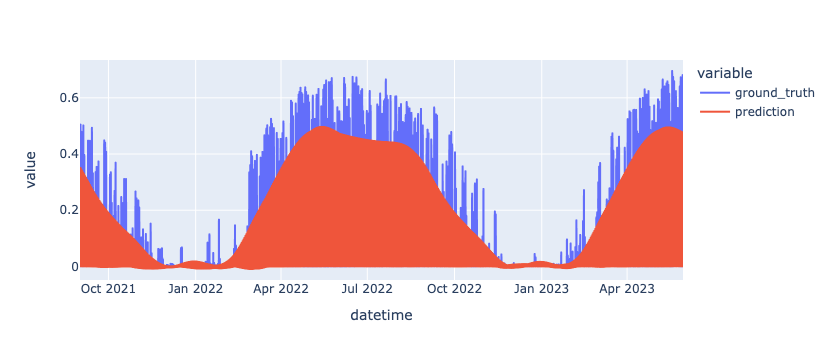

In [107]:
predictions = pl.DataFrame({'datetime': single_unit['prediction_datetime'],
                            'prediction': np.expm1(model_dep_fold.predict(single_unit.to_pandas())),
                            'ground_truth': single_unit['target_normalized']}
                          ).with_columns(
                                (pl.col('ground_truth') - pl.col('prediction')).alias('error')
                          )


px.line( predictions, x='datetime', y=['ground_truth', 'prediction'])

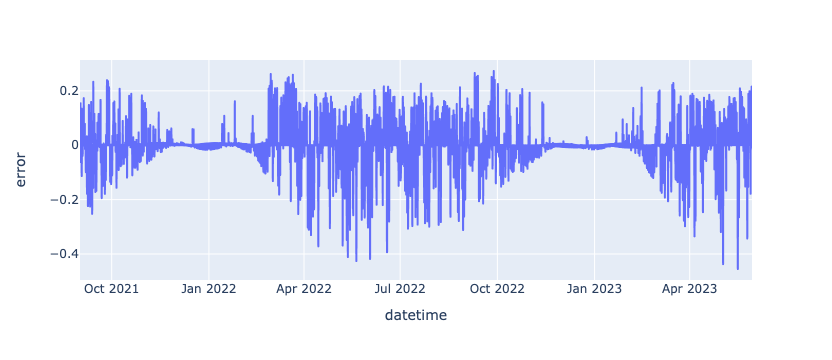

In [108]:
px.line(predictions, x='datetime', y='error')

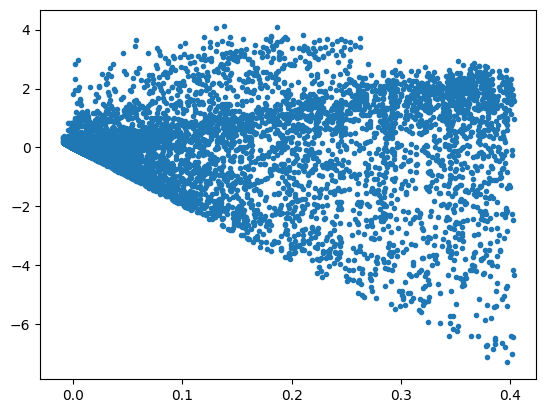

In [110]:
plt.plot( model_dep_fold.fittedvalues, model_dep_fold.resid_pearson, '.')

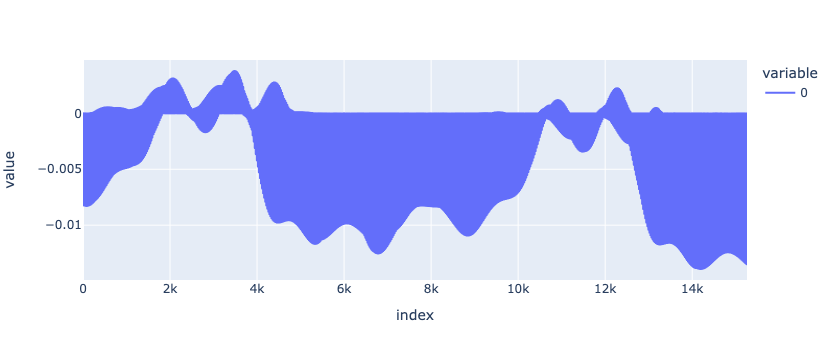

In [113]:
px.line( np.expm1(model_dep_fold.predict(single_unit.to_pandas())) 
        - model_dep.predict(single_unit.to_pandas()) )

Linear vs logarithmic doesn't really matter for fold changes. The differences in the models are miniscule.

Also note: the heteroskedasicity is _still present_. 

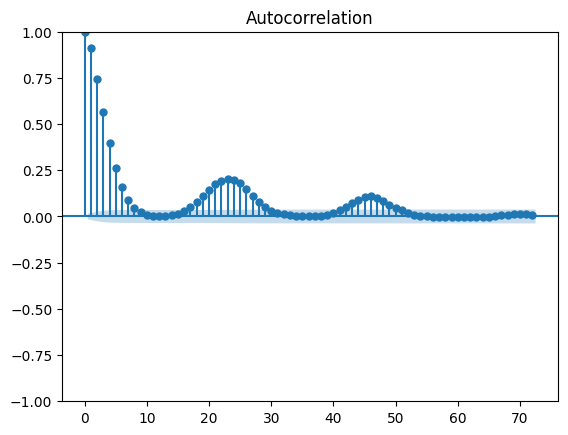

In [115]:
from statsmodels.graphics.tsaplots import plot_acf
_=plot_acf(predictions['error'], lags=72)

### model with autocorrelation

In [129]:
shifted_48 = single_unit[['target_normalized', 'prediction_datetime']
                 ].with_columns(pl.col('prediction_datetime') + datetime.timedelta(days=2) )

with_autocorrelation = single_unit.join(shifted_48, on='prediction_datetime', suffix='_shifted_day')

In [130]:
model_corr = smf.ols(f'target_normalized ~ C(time) * ( trend + {fourier_columns}) + target_normalized_shifted_day',
                     data=with_autocorrelation.to_pandas())
model_corr = model_corr.fit()

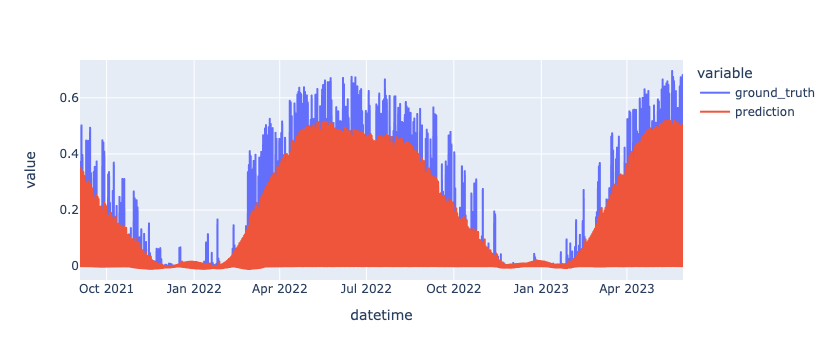

In [131]:
predictions = pl.DataFrame({'datetime': with_autocorrelation['prediction_datetime'],
                            'prediction': model_corr.predict(with_autocorrelation.to_pandas()),
                            'ground_truth': with_autocorrelation['target_normalized']}
                          ).with_columns(
                                (pl.col('ground_truth') - pl.col('prediction')).alias('error')
                          )


px.line( predictions, x='datetime', y=['ground_truth', 'prediction'])

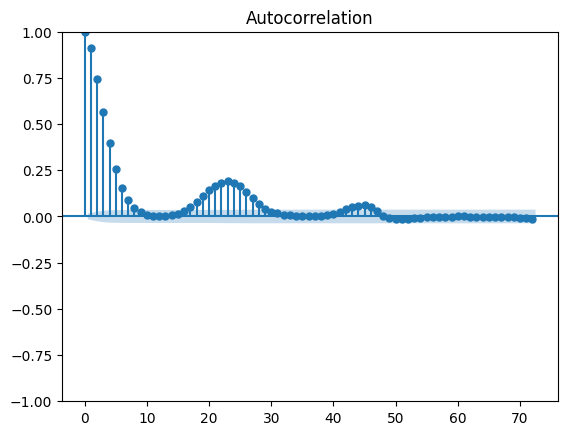

In [132]:
from statsmodels.graphics.tsaplots import plot_acf
_=plot_acf(predictions['error'], lags=72)

In [135]:
model_corr.params

Intercept                                0.000281
C(time)[T.datetime.time(1, 0)]          -0.000015
C(time)[T.datetime.time(2, 0)]          -0.000057
C(time)[T.datetime.time(3, 0)]          -0.000089
C(time)[T.datetime.time(4, 0)]          -0.000053
                                           ...   
C(time)[T.datetime.time(20, 0)]:cos_6   -0.000008
C(time)[T.datetime.time(21, 0)]:cos_6    0.000141
C(time)[T.datetime.time(22, 0)]:cos_6    0.000012
C(time)[T.datetime.time(23, 0)]:cos_6   -0.000011
target_normalized_shifted_day            0.083573
Length: 337, dtype: float64

Very negligible impact here. 

#### Overall, the linear model seems quite poorly suited to this data.

It may still be helpful as a starting point for models.